In [1]:
## what is life expectancy
## the number of years that a person is likely to live

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import re
import statistics as stats
import math

In [3]:
df = pd.read_csv("D:/python_projects/ML_Projects/01_Linear_Regression/Life Expectancy (WHO)/Life Expectancy Data.csv")

In [4]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [5]:
# status of countries
df.Status.unique()

array(['Developing', 'Developed'], dtype=object)

In [6]:
# Total number of countries
len(df["Country"].unique().tolist())

193

In [7]:
# variables of data
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [8]:
# removing space from variable names
df.columns = ['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_Mortality',
       'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B',
       'Measles ', ' BMI ', 'under_five_deaths ', 'Polio', 'Total_expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness_1_to_19_years', ' thinness_5-9_years',
       'Income_composition_of_resources', 'Schooling']
df.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,...,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [9]:
# unique number of life expactancy
df.columns

Index(['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_Mortality',
       'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B',
       'Measles ', ' BMI ', 'under_five_deaths ', 'Polio', 'Total_expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness_1_to_19_years', ' thinness_5-9_years',
       'Income_composition_of_resources', 'Schooling'],
      dtype='object')

In [10]:
df.Year.unique()

array([2015, 2014, 2013, 2012, 2011, 2010, 2009, 2008, 2007, 2006, 2005,
       2004, 2003, 2002, 2001, 2000], dtype=int64)

In [11]:
## Missing value imputation
class mvImputation:
    def __init__(self, df):
        self.df = df
    def find_missing(self):
        for i in range(len(self.df.columns)):
            cols = self.df.columns[i]
            #print(f"column name is : {cols}")
            if self.df[cols].isnull().sum() > 0:
                #print(f"total missing value are: {self.df[cols].isnull().sum()}")
                for j in range(len(self.df[cols])):
                    if math.isnan(self.df[cols][j]) == True:
                        self.df[cols][j] = round(np.mean(self.df[cols]), 2)
                    else:
                        continue

In [12]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life_expectancy                     10
Adult_Mortality                     10
infant_deaths                        0
Alcohol                            194
percentage_expenditure               0
Hepatitis_B                        553
Measles                              0
 BMI                                34
under_five_deaths                    0
Polio                               19
Total_expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness_1_to_19_years             34
 thinness_5-9_years                 34
Income_composition_of_resources    167
Schooling                          163
dtype: int64

In [13]:
MVI = mvImputation(df)
MVI.find_missing()

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


In [14]:
df.isnull().sum()

Country                            0
Year                               0
Status                             0
Life_expectancy                    0
Adult_Mortality                    0
infant_deaths                      0
Alcohol                            0
percentage_expenditure             0
Hepatitis_B                        0
Measles                            0
 BMI                               0
under_five_deaths                  0
Polio                              0
Total_expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness_1_to_19_years            0
 thinness_5-9_years                0
Income_composition_of_resources    0
Schooling                          0
dtype: int64

In [15]:
# find upper and lower limit

Q1 = np.percentile(df.Life_expectancy, 25)
Q3 = np.percentile(df.Life_expectancy, 75)
IQR = Q3 - Q1
print(IQR)
Lower_limit = Q1 - 1.5*IQR
Upper_limit = Q3 + 1.5*IQR
print(round(Lower_limit+1, 2), round(Upper_limit+1, 2))

12.399999999999991
45.6 95.2


In [16]:
# Find outliers
def outliers(data):
    threshold = 3
    mean = np.mean(data)
    std = np.std(data)
    outline = []
    for i in range(len(data)):
        z_socre = (data[i]-mean)/std
        if np.abs(z_socre) > threshold:
            outline.append(data[i])
    return outline

In [17]:
# Impute outliers unsing upper and lower limit
for i in range(len(df.columns)):
    A1 = df.columns[i]
    try:
        Q1 = np.percentile(df[A1], 25)
        Q3 = np.percentile(df[A1], 75)
        IQR = Q3 - Q1
        Lower_limit = Q1 - 1.5*IQR
        Lower_limit = abs(round(Lower_limit, 2))
        Upper_limit = Q3 + 1.5*IQR
        Upper_limit = abs(round(Upper_limit, 2))
    except TypeError:
        continue
    for j in outliers(df[A1]):
        for k in range(len(df[A1])):
            if j > 0:
                if df[A1][k] == j:
                    if (df[A1][k]) <= Lower_limit:
                        df[A1][k] = Lower_limit
                    elif df[A1][k] >= Upper_limit:
                         df[A1][k] = Upper_limit


C:\Users\ShubhamKS\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [18]:
for i in range(len(df.columns)):
    col_disc = df.columns[i] 
    print(df[col_disc].describe())

count         2938
unique         193
top       Maldives
freq            16
Name: Country, dtype: object
count    2938.000000
mean     2007.518720
std         4.613841
min      2000.000000
25%      2004.000000
50%      2008.000000
75%      2012.000000
max      2015.000000
Name: Year, dtype: float64
count           2938
unique             2
top       Developing
freq            2426
Name: Status, dtype: object
count    2938.000000
mean       69.229646
std         9.493576
min        41.000000
25%        63.200000
50%        72.000000
75%        75.600000
max        89.000000
Name: Life_expectancy, dtype: float64
count    2938.000000
mean      162.553097
std       116.938606
min         1.000000
25%        74.000000
50%       144.000000
75%       227.000000
max       536.000000
Name: Adult_Mortality, dtype: float64
count    2938.000000
mean       19.906399
std        44.020831
min         0.000000
25%         0.000000
50%         3.000000
75%        22.000000
max       377.000000
Name: in

In [19]:
df_developed = df[df.Status == "Developed"]
df_developed.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,...,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
112,Australia,2015,Developed,82.8,59.0,1,4.60,0.00,93.0,74,...,93.0,5.94,93.0,0.1,17837.17,23789338.0,0.6,0.6,0.937,20.4
113,Australia,2014,Developed,82.7,6.0,1,9.71,1096.81,91.0,340,...,92.0,9.42,92.0,0.1,17837.17,2346694.0,0.6,0.6,0.936,20.4
114,Australia,2013,Developed,82.5,61.0,1,9.87,1096.81,91.0,158,...,91.0,9.36,91.0,0.1,17837.17,23117353.0,0.6,0.6,0.933,20.3
115,Australia,2012,Developed,82.3,61.0,1,10.03,1096.81,91.0,199,...,92.0,9.36,92.0,0.1,17837.17,22728254.0,0.6,0.6,0.930,20.1
116,Australia,2011,Developed,82.0,63.0,1,10.30,1096.81,92.0,190,...,92.0,9.20,92.0,0.1,17837.17,223424.0,0.6,0.6,0.927,19.8


In [20]:
## Arrange the index value
df_developed.index = [i for i in range(len(df_developed.index))]
df_developed.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,...,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
0,Australia,2015,Developed,82.8,59.0,1,4.60,0.00,93.0,74,...,93.0,5.94,93.0,0.1,17837.17,23789338.0,0.6,0.6,0.937,20.4
1,Australia,2014,Developed,82.7,6.0,1,9.71,1096.81,91.0,340,...,92.0,9.42,92.0,0.1,17837.17,2346694.0,0.6,0.6,0.936,20.4
2,Australia,2013,Developed,82.5,61.0,1,9.87,1096.81,91.0,158,...,91.0,9.36,91.0,0.1,17837.17,23117353.0,0.6,0.6,0.933,20.3
3,Australia,2012,Developed,82.3,61.0,1,10.03,1096.81,91.0,199,...,92.0,9.36,92.0,0.1,17837.17,22728254.0,0.6,0.6,0.930,20.1
4,Australia,2011,Developed,82.0,63.0,1,10.30,1096.81,92.0,190,...,92.0,9.20,92.0,0.1,17837.17,223424.0,0.6,0.6,0.927,19.8


In [21]:
type(df_developed)

pandas.core.frame.DataFrame

In [22]:
## total countries in Developed dataset
len(df_developed.Country.unique().tolist())

32

In [23]:
df_developing = df[df.Status == "Developing"]


In [24]:
df_developing.index = [i for i in range(len(df_developing.index))]
df_developing.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,...,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,49.5,8.16,65.0,0.1,584.259210,33736494.0,17.20,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.50,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.70,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.90,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,15.35,18.2,0.454,9.5


In [25]:
## total countries in Developing dataset
len(df_developing.Country.unique().tolist())

161

In [31]:
for i in range(len(df_developed.columns)):
    column = df_developed.columns[i]
    print(f"{column} : {df_developed[column].unique()}")

Country : ['Australia' 'Austria' 'Belgium' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Denmark' 'Germany' 'Hungary' 'Iceland' 'Ireland' 'Italy' 'Japan'
 'Latvia' 'Lithuania' 'Luxembourg' 'Malta' 'Netherlands' 'New Zealand'
 'Norway' 'Poland' 'Portugal' 'Romania' 'Singapore' 'Slovakia' 'Slovenia'
 'Spain' 'Sweden' 'Switzerland'
 'United Kingdom of Great Britain and Northern Ireland'
 'United States of America']
Year : [2015 2014 2013 2012 2011 2010 2009 2008 2007 2006 2005 2004 2003 2002
 2001 2000]
Status : ['Developed']
Life_expectancy : [82.8 82.7 82.5 82.3 82.  81.9 81.7 81.3 81.2 81.  86.  83.  79.9 79.5
 81.5 81.4 81.1 88.  84.  79.8 79.4 79.3 78.8 78.7 78.6 78.1 89.  87.
 80.  78.9 78.3 78.  77.6 74.5 74.3 74.1 73.9 73.7 73.4 73.2 72.9 72.6
 72.2 72.1 72.  71.8 71.6 71.1 77.8 77.7 77.1 77.  76.6 76.3 76.  75.8
 75.9 75.2 75.4 74.7 74.8 74.9 85.  79.7 79.1 78.5 78.4 78.2 77.5 76.8
 76.5 75.3 75.1 79.2 77.3 76.9 79.6 75.6 75.5 75.  74.2 73.5 72.5 72.3
 71.7 82.4 82.1 81.8 81.6 79.  7

In [32]:
## univariate analysis. Data visualization

In [33]:
df_developed.corr()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
Year,1.000000,3.327253e-01,-0.146058,-0.041294,-2.658745e-01,-1.960771e-01,1.671816e-01,-0.088053,9.801876e-02,-0.038874,0.100961,6.180273e-02,0.140454,0.000000e+00,-3.949018e-02,-7.616235e-03,-8.627021e-02,-8.923587e-02,2.247704e-01,2.046749e-01
Life_expectancy,0.332725,1.000000e+00,-0.485489,-0.054764,-2.893011e-01,2.430591e-01,-1.743910e-01,0.037801,-4.396246e-02,-0.047953,0.002194,7.323483e-02,-0.035100,-9.364703e-15,2.838517e-01,6.621047e-02,-5.880775e-01,-5.965299e-01,4.765503e-01,3.514145e-01
Adult_Mortality,-0.146058,-4.854888e-01,1.000000,-0.048109,1.287500e-01,-1.744882e-01,1.439539e-01,-0.036493,-1.024146e-02,-0.048614,0.032628,-1.334642e-01,0.019202,0.000000e+00,-2.027206e-01,-4.404594e-02,4.716446e-01,4.805526e-01,-2.144295e-01,-1.458544e-01
infant_deaths,-0.041294,-5.476379e-02,-0.048109,1.000000,-6.405789e-02,-1.331603e-01,7.594722e-03,0.051480,4.750158e-02,0.997815,-0.183707,2.558957e-01,0.033054,0.000000e+00,-8.979990e-02,1.479484e-01,-1.070207e-01,-1.194428e-01,-4.893061e-01,-3.460150e-01
Alcohol,-0.265875,-2.893011e-01,0.128750,-0.064058,1.000000e+00,9.657038e-03,-2.645694e-02,-0.038832,1.065944e-01,-0.063599,-0.037082,5.436167e-02,-0.019169,-3.953090e-15,-8.843435e-02,-3.239747e-02,6.686831e-03,2.814408e-02,-2.326395e-01,-9.575608e-02
percentage_expenditure,-0.196077,2.430591e-01,-0.174488,-0.133160,9.657038e-03,1.000000e+00,-1.539911e-01,0.179494,-1.336769e-01,-0.134066,-0.017283,1.694203e-02,-0.128471,3.845103e-16,7.261224e-01,9.671059e-02,-2.132987e-01,-2.105581e-01,3.245199e-01,2.630278e-01
Hepatitis_B,0.167182,-1.743910e-01,0.143954,0.007595,-2.645694e-02,-1.539911e-01,1.000000e+00,-0.018762,6.689828e-02,0.011977,0.218704,-8.852268e-02,0.228451,1.501280e-14,-1.208467e-01,8.181973e-02,2.365707e-01,2.592250e-01,-1.910227e-01,-2.026637e-01
Measles,-0.088053,3.780051e-02,-0.036493,0.051480,-3.883183e-02,1.794936e-01,-1.876225e-02,1.000000,-1.022631e-01,0.064385,-0.027930,-7.307375e-03,-0.004407,0.000000e+00,1.472213e-01,5.409438e-02,4.355339e-02,1.766306e-02,1.052157e-02,-5.008182e-02
BMI,0.098019,-4.396246e-02,-0.010241,0.047502,1.065944e-01,-1.336769e-01,6.689828e-02,-0.102263,1.000000e+00,0.043874,0.054240,1.242705e-01,0.059468,-6.026084e-16,-9.347424e-02,8.579459e-02,-1.307655e-01,-1.025510e-01,-7.663570e-02,4.412439e-02
under_five_deaths,-0.038874,-4.795308e-02,-0.048614,0.997815,-6.359882e-02,-1.340655e-01,1.197697e-02,0.064385,4.387390e-02,1.000000,-0.180764,2.520622e-01,0.035466,0.000000e+00,-9.166845e-02,1.422616e-01,-1.072737e-01,-1.204372e-01,-4.810239e-01,-3.408855e-01


In [34]:
df_developed.drop("Status", axis=1, inplace=True)
df_developing.drop("Status", axis=1, inplace=True)

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


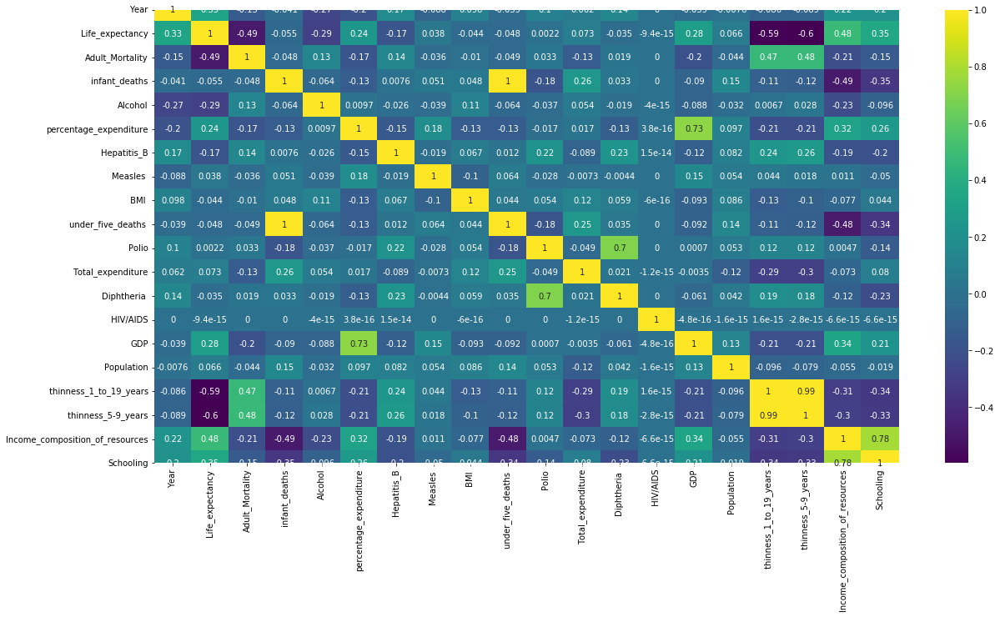

In [35]:
fig= plt.subplots(figsize=(20,10))
sns.heatmap(df_developed.corr(), annot= True, cmap = 'viridis')

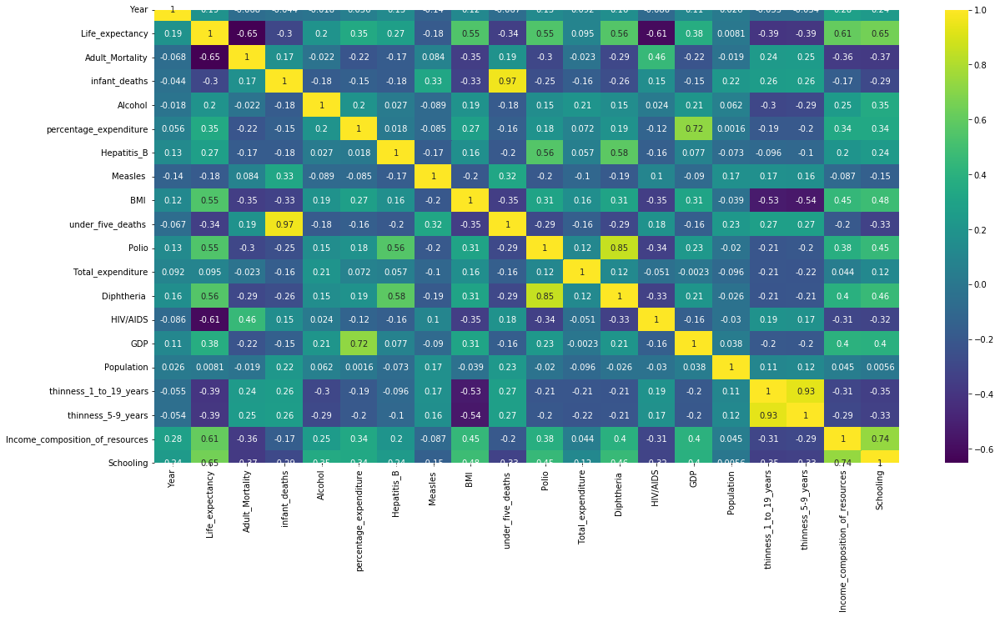

In [36]:
fig= plt.subplots(figsize=(20,10))
sns.heatmap(df_developing.corr(), annot= True, cmap = 'viridis')

Life_expectancy


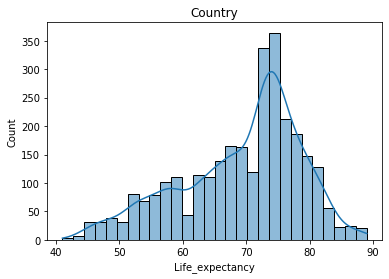

Adult_Mortality


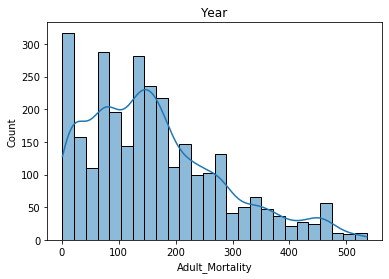

infant_deaths


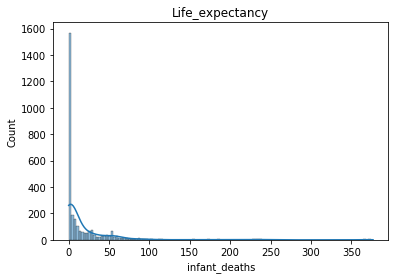

Alcohol


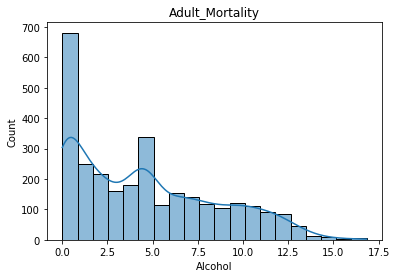

percentage_expenditure


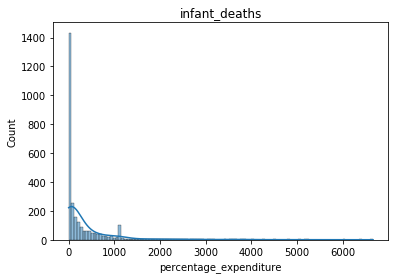

Hepatitis_B


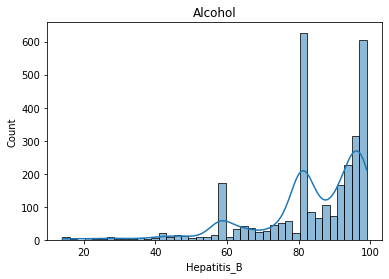

Measles 


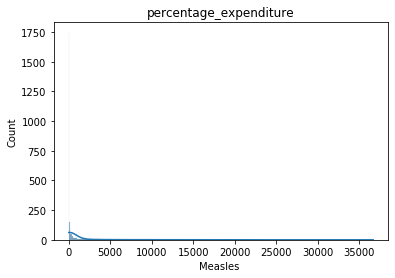

 BMI 


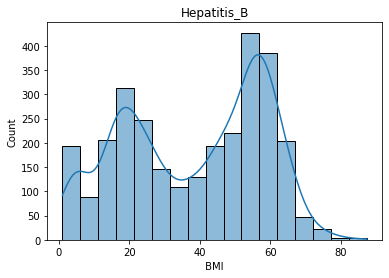

under_five_deaths 


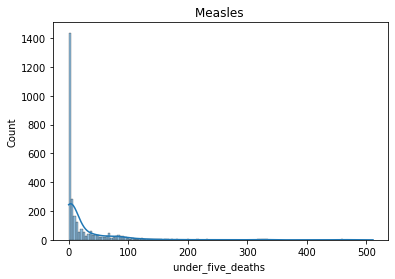

Polio


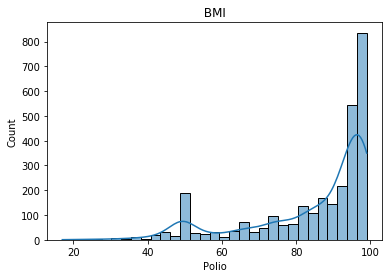

Total_expenditure


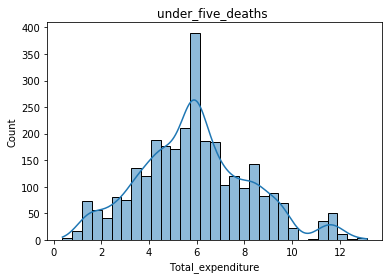

Diphtheria 


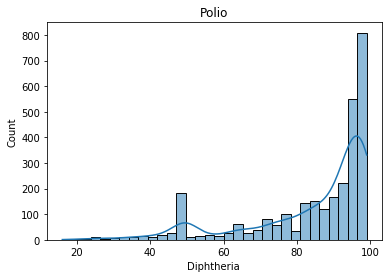

 HIV/AIDS


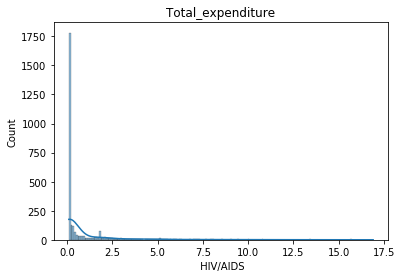

GDP


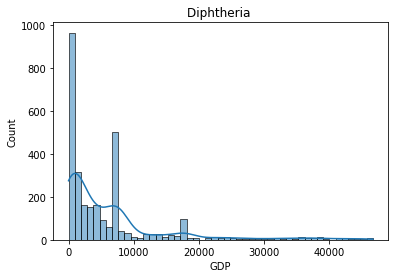

Population


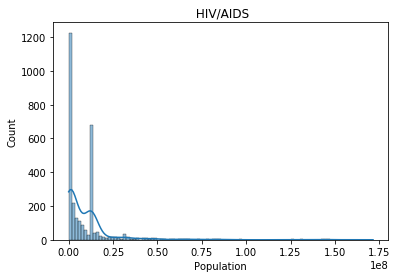

 thinness_1_to_19_years


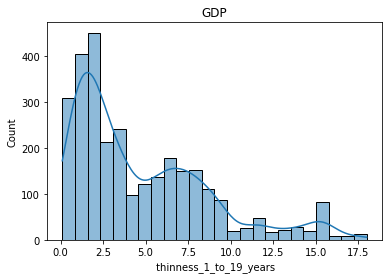

 thinness_5-9_years


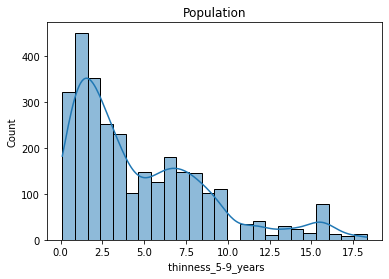

Income_composition_of_resources


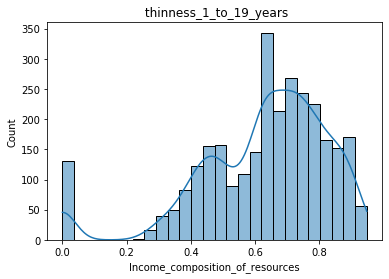

Schooling


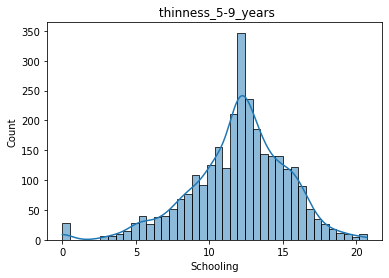

In [37]:
for i in range(len(df_developed.columns)):
    try:
        boxfig = df_developed.columns[i+2]
        print(boxfig)
        sns.histplot(df[boxfig], kde = True).set(title= df_developed.columns[i])
        plt.show()
    except IndexError:
        continue

Life_expectancy


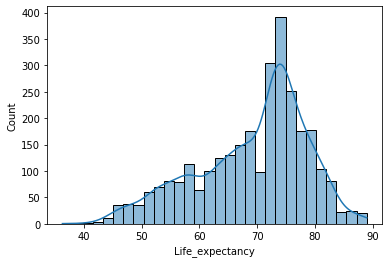

Adult_Mortality


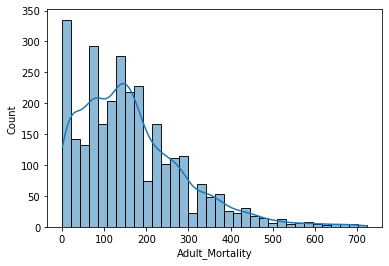

infant_deaths


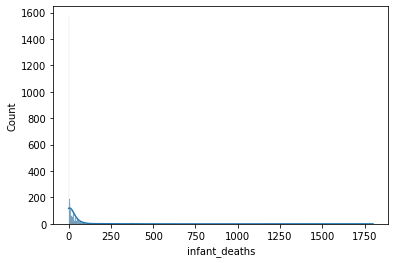

Alcohol


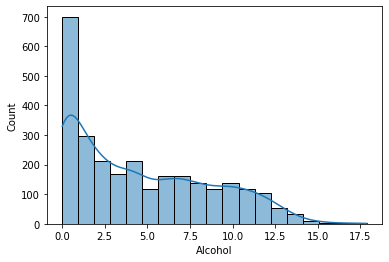

percentage_expenditure


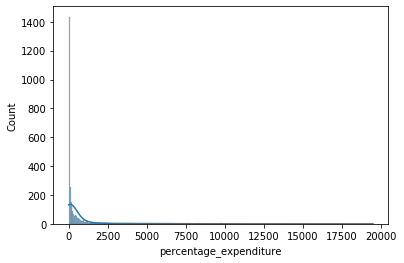

Hepatitis_B


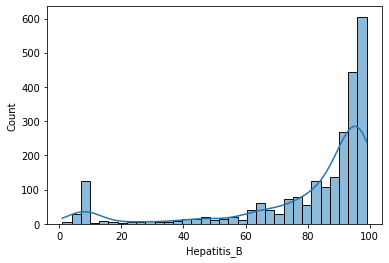

Measles 


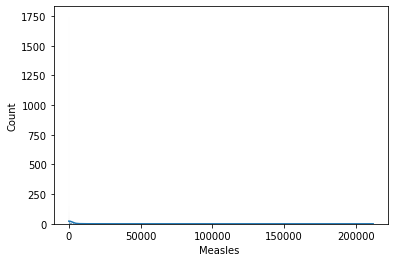

 BMI 


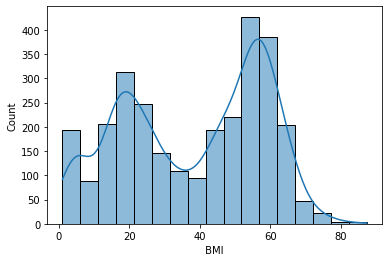

under_five_deaths 


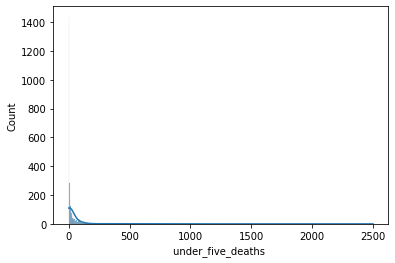

Polio


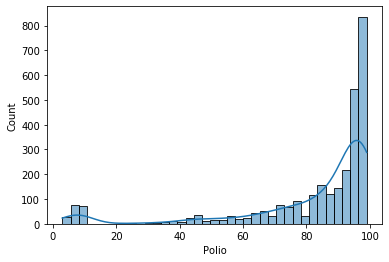

Total_expenditure


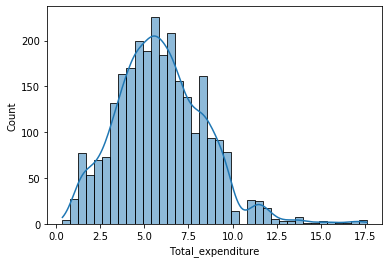

Diphtheria 


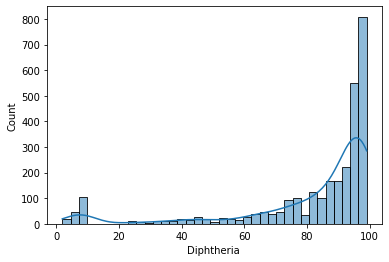

 HIV/AIDS


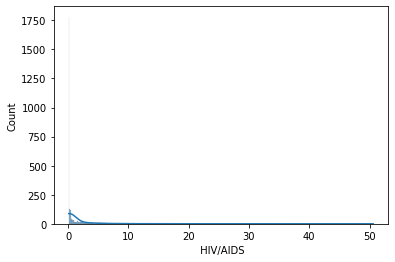

GDP


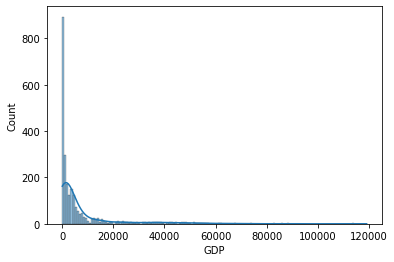

Population


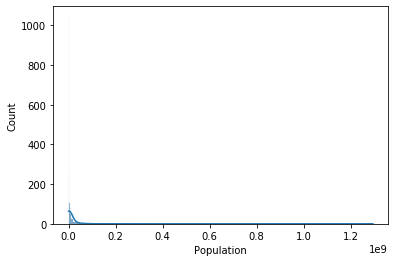

 thinness_1_to_19_years


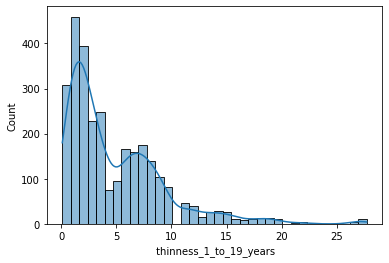

 thinness_5-9_years


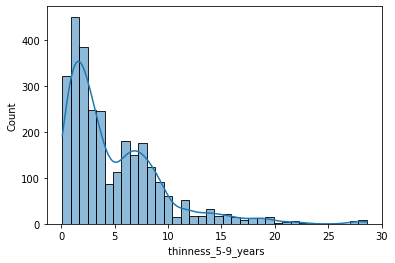

Income_composition_of_resources


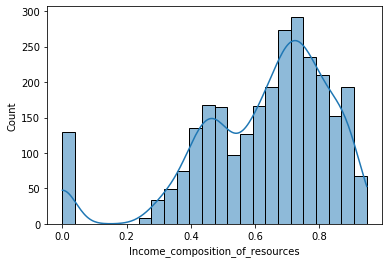

Schooling


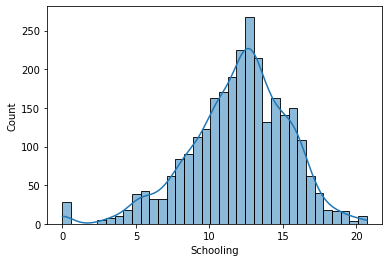

In [30]:
for i in range(len(df_developing.columns)):
    try:
        boxfig = df_developing.columns[i+2]
        print(boxfig)
        sns.histplot(df[boxfig], kde = True).set(title= df_developing.columns[i])
        plt.show()
    except IndexError:
        continue

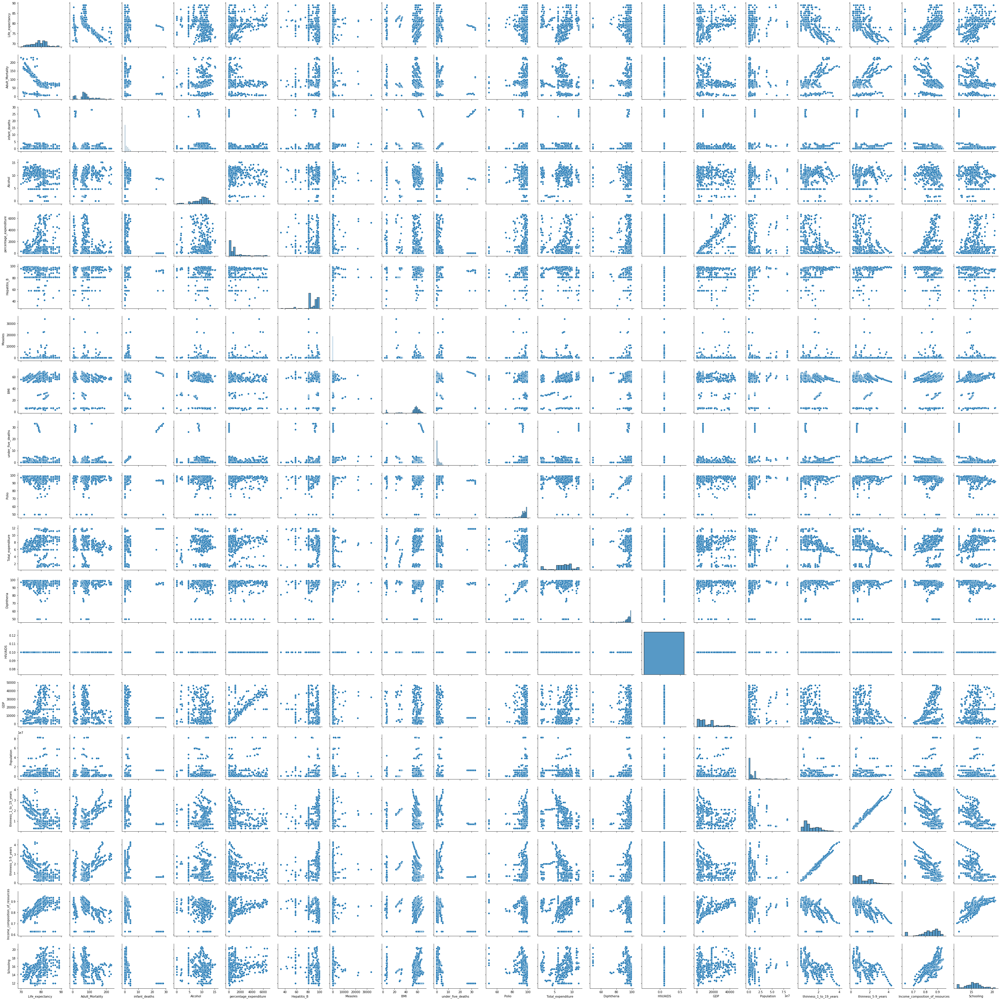

In [38]:
sns.pairplot(df_developed.iloc[:,2:])
## Double click left key to see clear view 

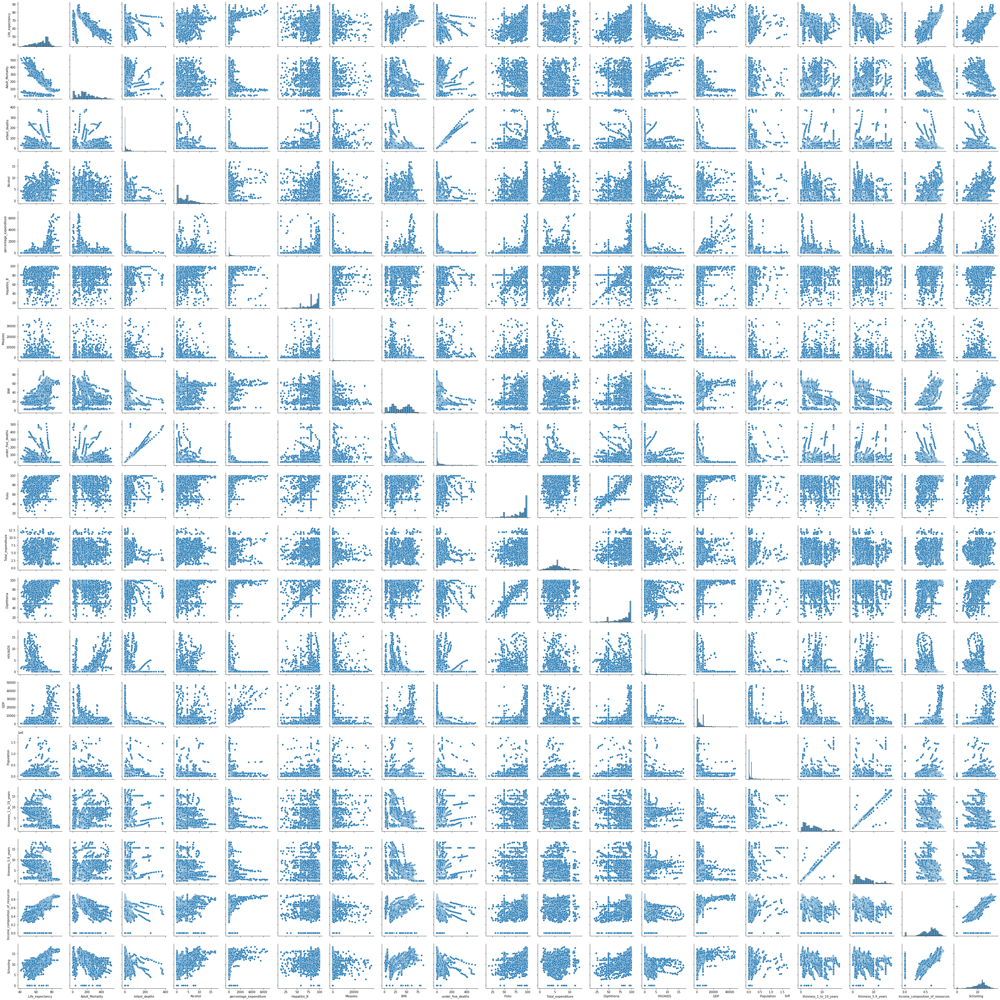

In [39]:
sns.pairplot(df_developing.iloc[:,2:])
## Double click left key to see clear view 

In [40]:
df_developed_country_mean = df_developed.groupby('Country', as_index=True).agg({i:np.mean for i in df_developed.iloc[:,2:].columns})

In [41]:
df_developing_country_mean = df_developing.groupby('Country', as_index=True).agg({i:np.mean for i in df_developing.iloc[:,2:].columns})

In [42]:
df_developed_country_mean.shape

(32, 19)

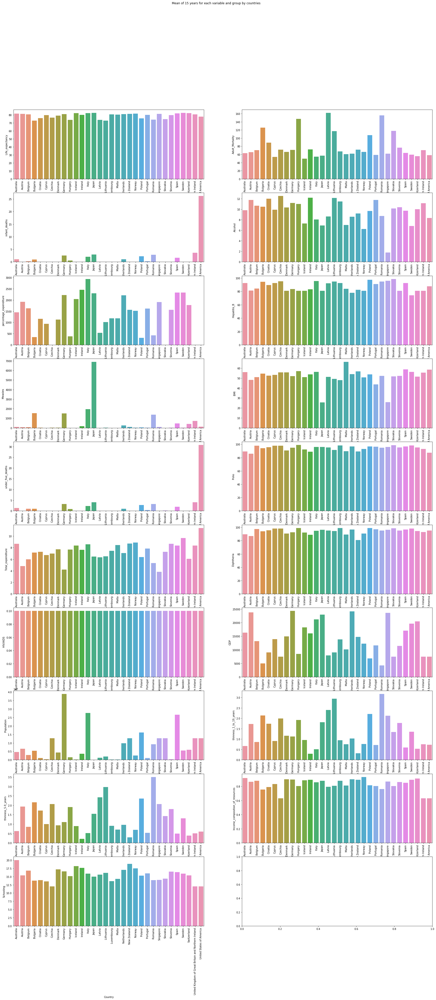

In [43]:
col_name = df_developed_country_mean.columns
fig, axes = plt.subplots(10, 2,figsize=(30, 60))
fig.suptitle('Mean of 15 years for each variable and group by countries')
for i in range(0,10):
    for j in range(0,2):
        for k in range(0,1):
            try:
                #print(col_name[k])
                bars = sns.barplot(ax=axes[i, j], data=df_developed_country_mean, x= df_developed_country_mean.index, 
                            y=df_developed_country_mean[col_name[k]])
                bars.set_xticklabels(bars.get_xticklabels(),rotation=90)
                col_name = col_name[1::]
            except IndexError:
                continue


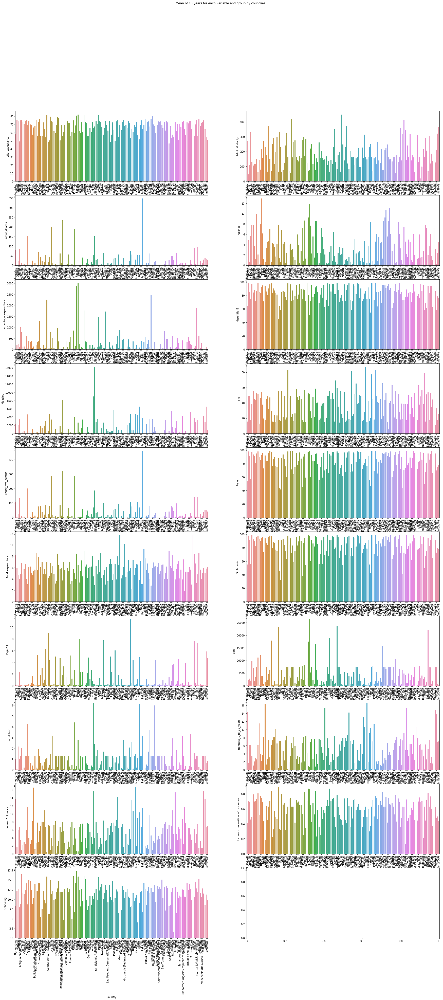

In [43]:
col_name = df_developing_country_mean.columns
fig, axes = plt.subplots(10, 2,figsize=(30, 60))
fig.suptitle('Mean of 15 years for each variable and group by countries')
for i in range(0,10):
    for j in range(0,2):
        for k in range(0,1):
            try:
                #print(col_name[k])
                bars = sns.barplot(ax=axes[i, j], data=df_developing_country_mean, x= df_developing_country_mean.index, 
                            y=df_developing_country_mean[col_name[k]])
                bars.set_xticklabels(bars.get_xticklabels(),rotation=90)
                col_name = col_name[1::]
            except IndexError:
                continue


In [44]:
cor_var = pd.DataFrame(df_developed.corr())
cor_var.head()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
Year,1.000000,0.332725,-0.146058,-0.041294,-0.265875,-0.196077,0.167182,-0.088053,0.098019,-0.038874,0.100961,0.061803,0.140454,0.000000e+00,-0.039490,-0.007616,-0.086270,-0.089236,0.224770,0.204675
Life_expectancy,0.332725,1.000000,-0.485489,-0.054764,-0.289301,0.243059,-0.174391,0.037801,-0.043962,-0.047953,0.002194,0.073235,-0.035100,-9.364703e-15,0.283852,0.066210,-0.588078,-0.596530,0.476550,0.351415
Adult_Mortality,-0.146058,-0.485489,1.000000,-0.048109,0.128750,-0.174488,0.143954,-0.036493,-0.010241,-0.048614,0.032628,-0.133464,0.019202,0.000000e+00,-0.202721,-0.044046,0.471645,0.480553,-0.214429,-0.145854
infant_deaths,-0.041294,-0.054764,-0.048109,1.000000,-0.064058,-0.133160,0.007595,0.051480,0.047502,0.997815,-0.183707,0.255896,0.033054,0.000000e+00,-0.089800,0.147948,-0.107021,-0.119443,-0.489306,-0.346015
Alcohol,-0.265875,-0.289301,0.128750,-0.064058,1.000000,0.009657,-0.026457,-0.038832,0.106594,-0.063599,-0.037082,0.054362,-0.019169,-3.953090e-15,-0.088434,-0.032397,0.006687,0.028144,-0.232640,-0.095756


In [45]:
# cor_var["Year"]["Year"]

In [46]:
# A = cor_var.columns
# B = cor_var.index
# for i in A:
#     for j in B:
#         #print(i,j)
#         print(i,j,cor_var[i][j])

In [47]:
ALL = cor_var.columns
BLL = cor_var.index
for i in ALL:
    for j in BLL:
        if cor_var[i][j] > 0.6 and cor_var[i][j] <1:
            #print(i,j,cor_var[i][j])
            print([i,j])

['infant_deaths', 'under_five_deaths ']
['percentage_expenditure', 'GDP']
['under_five_deaths ', 'infant_deaths']
['Polio', 'Diphtheria ']
['Diphtheria ', 'Polio']
['GDP', 'percentage_expenditure']
[' thinness_1_to_19_years', ' thinness_5-9_years']
[' thinness_5-9_years', ' thinness_1_to_19_years']
['Income_composition_of_resources', 'Schooling']
['Schooling', 'Income_composition_of_resources']


In [48]:
# corr_matrix = df_developed.corr()
# high_corr_var=np.where(corr_matrix>0.5)
# high_corr_var=[(corr_matrix.columns[x],corr_matrix.columns[y]) for x,y in zip(*high_corr_var) if x!=y and x<y]
# high_corr_var

In [49]:
cor_var1 = pd.DataFrame(df_developing.corr())
cor_var1.head()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
Year,1.000000,0.187883,-0.067870,-0.043887,-0.018215,0.055872,0.131060,-0.137052,0.117815,-0.067297,0.129591,0.091837,0.159935,-0.085558,0.114736,0.025788,-0.054614,-0.054147,0.279110,0.241205
Life_expectancy,0.187883,1.000000,-0.651141,-0.298730,0.198687,0.347537,0.271555,-0.182021,0.546359,-0.344902,0.545127,0.094554,0.556487,-0.606590,0.380297,0.008068,-0.394687,-0.389844,0.611116,0.647916
Adult_Mortality,-0.067870,-0.651141,1.000000,0.172140,-0.022089,-0.216098,-0.174937,0.083551,-0.354102,0.193460,-0.300077,-0.023135,-0.293973,0.457019,-0.223858,-0.019475,0.241345,0.249722,-0.362595,-0.367975
infant_deaths,-0.043887,-0.298730,0.172140,1.000000,-0.178098,-0.153557,-0.179708,0.326164,-0.327094,0.966854,-0.254959,-0.161870,-0.257876,0.150806,-0.153211,0.224736,0.255698,0.260647,-0.165007,-0.286333
Alcohol,-0.018215,0.198687,-0.022089,-0.178098,1.000000,0.198377,0.027204,-0.089103,0.190180,-0.184099,0.153524,0.206329,0.151661,0.023565,0.208225,0.061598,-0.300976,-0.286874,0.248663,0.352421


In [50]:
ALL1 = cor_var1.columns
BLL1 = cor_var1.index
for i in ALL1:
    for j in BLL1:
        if cor_var1[i][j] > 0.4 and cor_var1[i][j] <1:
            #print(i,j,cor_var[i][j])
            print([i,j])
            print(i)

['Life_expectancy', ' BMI ']
Life_expectancy
['Life_expectancy', 'Polio']
Life_expectancy
['Life_expectancy', 'Diphtheria ']
Life_expectancy
['Life_expectancy', 'Income_composition_of_resources']
Life_expectancy
['Life_expectancy', 'Schooling']
Life_expectancy
['Adult_Mortality', ' HIV/AIDS']
Adult_Mortality
['infant_deaths', 'under_five_deaths ']
infant_deaths
['percentage_expenditure', 'GDP']
percentage_expenditure
['Hepatitis_B', 'Polio']
Hepatitis_B
['Hepatitis_B', 'Diphtheria ']
Hepatitis_B
[' BMI ', 'Life_expectancy']
 BMI 
[' BMI ', 'Income_composition_of_resources']
 BMI 
[' BMI ', 'Schooling']
 BMI 
['under_five_deaths ', 'infant_deaths']
under_five_deaths 
['Polio', 'Life_expectancy']
Polio
['Polio', 'Hepatitis_B']
Polio
['Polio', 'Diphtheria ']
Polio
['Polio', 'Schooling']
Polio
['Diphtheria ', 'Life_expectancy']
Diphtheria 
['Diphtheria ', 'Hepatitis_B']
Diphtheria 
['Diphtheria ', 'Polio']
Diphtheria 
['Diphtheria ', 'Schooling']
Diphtheria 
[' HIV/AIDS', 'Adult_Mortality'

In [51]:
#1.	Does various predicting factors which has been chosen initially really affect the Life expectancy? 
# What are the predicting variables actually affecting the life expectancy?

# Ans: - Yes, all the predicting factors which has been chosen initially really affect the Life expectancy for Developting and developed countries


In [52]:
LE_GDP = df_developing[df_developing['Life_expectancy']< 65].groupby("Country")[["Life_expectancy", "percentage_expenditure", "GDP"]].agg({'Life_expectancy':np.mean}, {'percentage_expenditure': np.mean}, {'GDP': np.mean} )

In [53]:
LE_GDP.columns = ["Life_expectancy","percentage_expenditure","GDP"]

In [54]:
LE_GDP

,Life_expectancy,percentage_expenditure,GDP
Country,,,
Afghanistan,57.740000,32.538809,323.732507
Angola,49.018750,102.100268,1975.143045
Benin,57.568750,43.991956,561.167968
Bhutan,62.740000,55.130323,586.927964
Bolivia (Plurinational State of),63.575000,0.000000,7483.160000
...,...,...,...
Uganda,54.953333,44.820819,404.952243
United Republic of Tanzania,55.273333,0.000000,7483.160000
Yemen,63.108333,0.000000,7483.160000


[Text(0, 0, 'Afghanistan'),
 Text(0, 0, 'Angola'),
 Text(0, 0, 'Benin'),
 Text(0, 0, 'Bhutan'),
 Text(0, 0, 'Bolivia (Plurinational State of)'),
 Text(0, 0, 'Botswana'),
 Text(0, 0, 'Burkina Faso'),
 Text(0, 0, 'Burundi'),
 Text(0, 0, 'Cambodia'),
 Text(0, 0, 'Cameroon'),
 Text(0, 0, 'Central African Republic'),
 Text(0, 0, 'Chad'),
 Text(0, 0, 'Comoros'),
 Text(0, 0, 'Congo'),
 Text(0, 0, "Côte d'Ivoire"),
 Text(0, 0, 'Democratic Republic of the Congo'),
 Text(0, 0, 'Djibouti'),
 Text(0, 0, 'Equatorial Guinea'),
 Text(0, 0, 'Eritrea'),
 Text(0, 0, 'Ethiopia'),
 Text(0, 0, 'Gabon'),
 Text(0, 0, 'Gambia'),
 Text(0, 0, 'Ghana'),
 Text(0, 0, 'Guinea'),
 Text(0, 0, 'Guinea-Bissau'),
 Text(0, 0, 'Haiti'),
 Text(0, 0, 'India'),
 Text(0, 0, 'Iraq'),
 Text(0, 0, 'Kazakhstan'),
 Text(0, 0, 'Kenya'),
 Text(0, 0, 'Kiribati'),
 Text(0, 0, "Lao People's Democratic Republic"),
 Text(0, 0, 'Lesotho'),
 Text(0, 0, 'Liberia'),
 Text(0, 0, 'Madagascar'),
 Text(0, 0, 'Malawi'),
 Text(0, 0, 'Mali'),
 Text

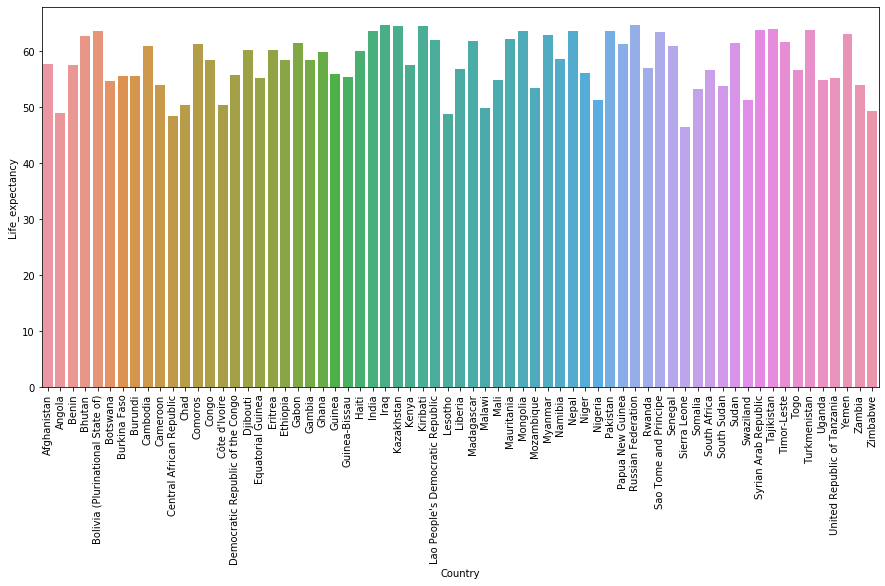

In [55]:
fig, ax = plt.subplots(figsize=(15, 7))

LE_Bar = sns.barplot(data= LE_GDP, x = LE_GDP.index, y = LE_GDP.Life_expectancy)
LE_Bar.set_xticklabels(LE_Bar.get_xticklabels(),rotation=90)

In [56]:
## 2. Should a country having a lower life expectancy value(<65) increase its healthcare expenditure in order to improve its average lifespan?

## Ans: - yes for developing countries

In [57]:
LIA_developing = df_developing.groupby("Country").agg({'Life_expectancy': np.mean, 'infant_deaths' : np.mean, 'Adult_Mortality': np.mean})

In [58]:
LIA_developing = round(LIA_developing,0)

In [59]:
LIA_developing

,Life_expectancy,infant_deaths,Adult_Mortality
Country,,,
Afghanistan,58.0,78.0,269.0
Albania,75.0,1.0,45.0
Algeria,74.0,20.0,108.0
Angola,49.0,84.0,329.0
Antigua and Barbuda,75.0,0.0,128.0
...,...,...,...
Venezuela (Bolivarian Republic of),73.0,9.0,163.0
Viet Nam,75.0,29.0,127.0
Yemen,64.0,39.0,212.0


In [60]:
#3.	How does Infant and Adult mortality rates affect life expectancy?


[Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''

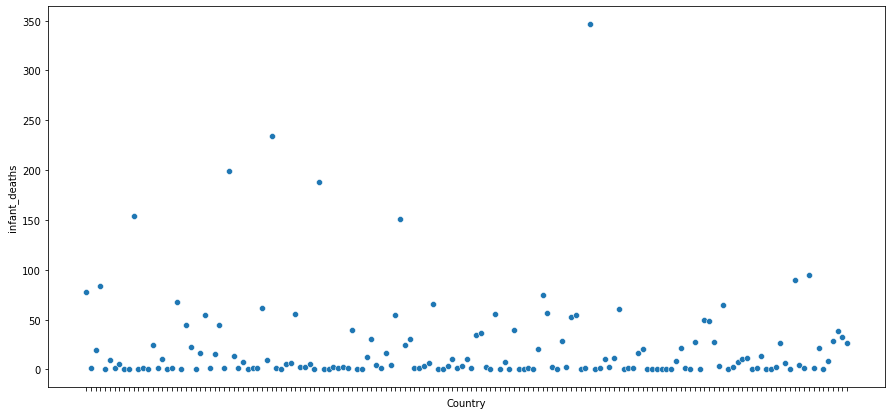

In [61]:
fig, ax = plt.subplots(figsize=(15, 7))

LIA_Scater = sns.scatterplot(LIA_developing, x = LIA_developing.index, y = LIA_developing.infant_deaths)

LIA_Scater.set_xticklabels(LIA_Scater.get_xticklabels(),rotation=90)

[Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''),
 Text(0, 0, ''

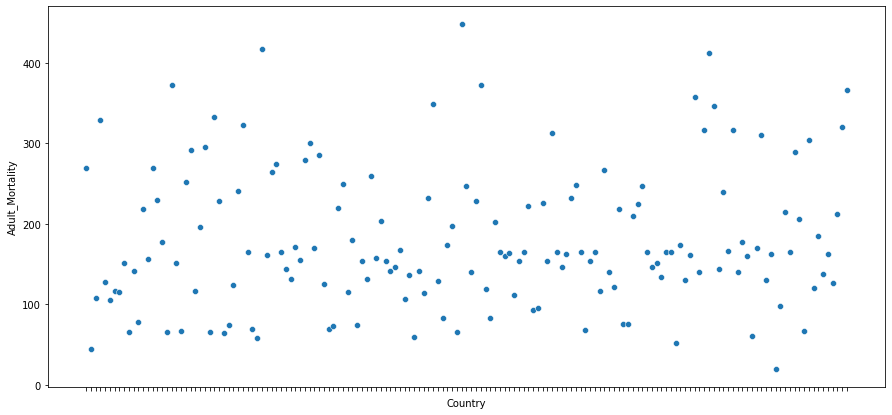

In [62]:
fig, ax = plt.subplots(figsize=(15, 7))

LIA_Scater = sns.scatterplot(LIA_developing, x = LIA_developing.index, y = LIA_developing.Adult_Mortality)

LIA_Scater.set_xticklabels(LIA_Scater.get_xticklabels(),rotation=90)

In [63]:
#4.	Does Life Expectancy has positive or negative correlation with eating habits, lifestyle, exercise, smoking, drinking alcohol etc.

In [64]:
Corr_P_N_developed = pd.DataFrame(df_developed.corr())

In [65]:
Corr_P_N_developed["Total_expenditure"]["Life_expectancy"]## mean of variables

0.07323482617422541

In [66]:
Corr_P_N_developing= pd.DataFrame(df_developing.corr())

In [67]:
Corr_P_N_developing["Total_expenditure"]["Life_expectancy"]## mean of variables

0.09455392810854903

In [68]:
# 5.	What is the impact of schooling on the lifespan of humans?

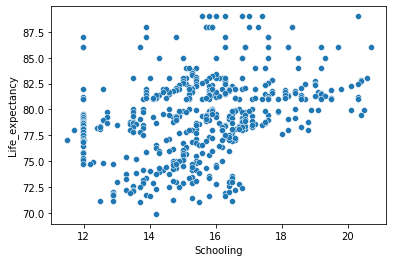

In [69]:
sns.scatterplot(df_developed, x = df_developed.Schooling, y = df_developed.Life_expectancy)

In [70]:
Corr_P_N_developed["Total_expenditure"]["Schooling"]## mean of variables

0.08046725096877883

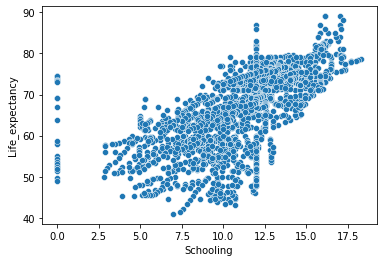

In [71]:
sns.scatterplot(df_developing, x = df_developing.Schooling, y = df_developing.Life_expectancy)

In [72]:
Corr_P_N_developing["Total_expenditure"]["Schooling"]## mean of variables

0.12218256164949924

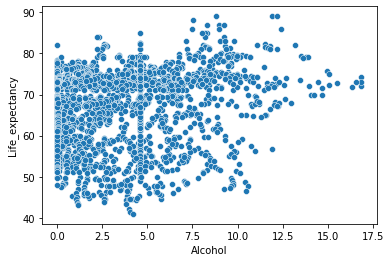

In [73]:
sns.scatterplot(df_developing, x = df_developing.Alcohol, y = df_developing.Life_expectancy )

In [74]:
# 6.	Does Life Expectancy have positive or negative relationship with drinking alcohol?

In [75]:
Corr_P_N_developing["Life_expectancy"]["Alcohol"]## mean of variables

0.19868654746272538

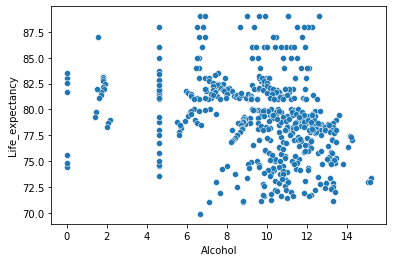

In [76]:
sns.scatterplot(df_developed, x = df_developed.Alcohol, y = df_developed.Life_expectancy )

In [77]:
Corr_P_N_developed["Life_expectancy"]["Alcohol"]## mean of variables

-0.28930107258726356

In [78]:
# 7.	Do densely populated countries tend to have lower life expectancy?

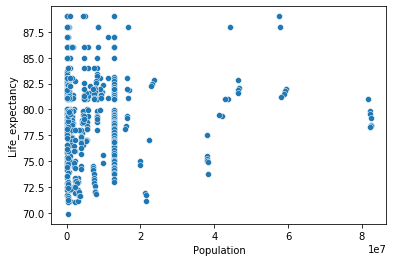

In [79]:
sns.scatterplot(df_developed, x = df_developed.Population, y = df_developed.Life_expectancy)

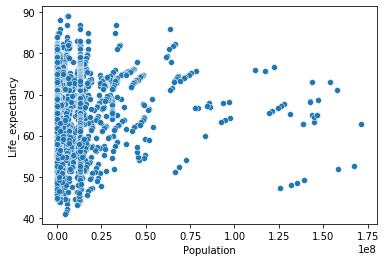

In [80]:
sns.scatterplot(df_developing, x = df_developing.Population, y = df_developing.Life_expectancy)

In [81]:
df.drop(["Country", "Year"], axis=1, inplace=True)
df.head()

,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
0,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,49.5,8.16,65.0,0.1,584.259210,33736494.0,17.20,17.3,0.479,10.1
1,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.50,17.5,0.476,10.0
2,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.70,17.7,0.470,9.9
3,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.90,18.0,0.463,9.8
4,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,15.35,18.2,0.454,9.5


In [82]:
df.Status = df.Status.map({"Developed": 1, "Developing": 2})

In [83]:
df.head()

,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
0,2,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,49.5,8.16,65.0,0.1,584.259210,33736494.0,17.20,17.3,0.479,10.1
1,2,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.50,17.5,0.476,10.0
2,2,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.70,17.7,0.470,9.9
3,2,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.90,18.0,0.463,9.8
4,2,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,15.35,18.2,0.454,9.5


In [84]:
# Test Train split
df1 = pd.DataFrame(df)

In [85]:
df1.columns

Index(['Status', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths',
       'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles ', ' BMI ',
       'under_five_deaths ', 'Polio', 'Total_expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness_1_to_19_years',
       ' thinness_5-9_years', 'Income_composition_of_resources', 'Schooling'],
      dtype='object')

In [86]:
df1.drop("Life_expectancy", axis=1, inplace=True)

In [87]:
df1.head()

,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
0,2,263.0,62,0.01,71.279624,65.0,1154,19.1,83,49.5,8.16,65.0,0.1,584.259210,33736494.0,17.20,17.3,0.479,10.1
1,2,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.50,17.5,0.476,10.0
2,2,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.70,17.7,0.470,9.9
3,2,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.90,18.0,0.463,9.8
4,2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,15.35,18.2,0.454,9.5


In [88]:
X = df1
X

,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
0,2,263.0,62,0.01,71.279624,65.00,1154,19.1,83,49.5,8.16,65.0,0.10,584.259210,33736494.0,17.20,17.3,0.479,10.1
1,2,271.0,64,0.01,73.523582,62.00,492,18.6,86,58.0,8.18,62.0,0.10,612.696514,327582.0,17.50,17.5,0.476,10.0
2,2,268.0,66,0.01,73.219243,64.00,430,18.1,89,62.0,8.13,64.0,0.10,631.744976,31731688.0,17.70,17.7,0.470,9.9
3,2,272.0,69,0.01,78.184215,67.00,2787,17.6,93,67.0,8.52,67.0,0.10,669.959000,3696958.0,17.90,18.0,0.463,9.8
4,2,275.0,71,0.01,7.097109,68.00,3013,17.2,97,68.0,7.87,68.0,0.10,63.537231,2978599.0,15.35,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2,456.5,27,4.36,0.000000,68.00,31,27.1,42,67.0,7.13,65.0,1.85,454.366654,12777511.0,9.40,9.4,0.407,9.2
2934,2,456.5,26,4.06,0.000000,58.35,998,26.7,41,49.5,6.52,68.0,1.85,453.351155,12633897.0,9.80,9.9,0.418,9.5
2935,2,73.0,25,4.43,0.000000,73.00,304,26.3,40,73.0,6.53,71.0,1.85,57.348340,125525.0,1.20,1.3,0.427,10.0
2936,2,456.5,25,1.72,0.000000,76.00,529,25.9,39,76.0,6.16,75.0,1.85,548.587312,12366165.0,1.60,1.7,0.427,9.8


In [89]:
y = df.Life_expectancy 

In [90]:
y

0       65.0
1       59.9
2       59.9
3       59.5
4       59.2
        ... 
2933    44.3
2934    44.5
2935    44.8
2936    45.3
2937    46.0
Name: Life_expectancy, Length: 2938, dtype: float64

In [91]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.30, random_state = 42)

In [92]:
X_train

,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_to_19_years,thinness_5-9_years,Income_composition_of_resources,Schooling
1641,1,64.0,0,7.14,2655.573684,86.00,1,66.6,0,72.0,8.15,72.0,0.1,21928.767000,49379.00,0.7,0.7,0.813,14.6
618,2,394.0,8,2.03,0.000000,80.94,146,21.7,13,62.0,2.42,62.0,5.9,7483.160000,12753375.12,8.8,8.5,0.496,9.4
406,2,283.0,44,4.55,81.143047,92.00,900,16.1,77,91.0,7.41,92.0,1.1,552.745552,1514199.00,9.3,8.8,0.356,5.9
1094,2,289.0,4,3.57,40.453674,86.00,0,23.7,7,85.0,5.46,86.0,5.7,692.699890,1596154.00,7.8,7.7,0.410,9.0
1788,2,217.0,58,0.26,0.530573,85.00,1088,17.6,78,84.0,1.68,86.0,0.6,41.451000,49171586.00,13.2,13.5,0.484,8.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1638,1,59.0,0,6.91,3601.287457,82.00,3,68.0,0,96.0,9.60,96.0,0.1,22821.847000,416268.00,0.8,0.7,0.826,14.8
1095,2,287.0,4,3.21,53.307827,83.00,26,23.1,7,82.0,6.70,83.0,5.9,543.957418,155588.00,8.0,7.9,0.405,8.9
1130,2,266.0,17,6.08,56.778587,80.94,0,4.7,23,62.0,5.56,63.0,2.7,615.819819,9556889.00,4.2,4.2,0.458,8.4
1294,1,72.0,2,9.30,3519.258515,95.00,10982,57.0,3,97.0,8.17,96.0,0.1,27387.225800,5731323.00,0.5,0.5,0.841,15.4


In [93]:
y_train

1641    80.0
618     55.3
406     56.9
1094    57.1
1788    64.5
        ... 
1638    87.0
1095    56.7
1130    61.8
1294    79.9
860     59.4
Name: Life_expectancy, Length: 2056, dtype: float64

In [94]:
from sklearn.linear_model import LinearRegression
regression = LinearRegression()
regression.fit(X_train,y_train)

LinearRegression()

In [95]:
## Mean Squared Error => mse should be less
from sklearn.model_selection import cross_val_score
mse = cross_val_score(regression,X_train,y_train,scoring='neg_mean_squared_error', cv = 5)

In [96]:
mean = np.mean(mse)
mean

-20.067992879611797

In [97]:
## predictions karenge test dataset me 
reg_pred = regression.predict(X_test)
reg_pred

array([68.12654184, 77.64712278, 74.8907105 , 78.34208452, 54.50930009,
       49.3108052 , 69.61075047, 71.56556196, 74.08539558, 48.34166105,
       48.67965305, 62.05432817, 64.45730843, 70.32631985, 70.94816707,
       61.34760569, 53.9415525 , 82.64099545, 67.37413941, 83.15182172,
       83.02298392, 83.03451723, 70.97866787, 68.93849318, 70.51693441,
       67.03168364, 60.08629396, 60.19313376, 79.53344467, 71.66454679,
       67.36400375, 75.27199018, 68.12094889, 68.51498262, 78.64516801,
       53.81385172, 66.09035035, 72.81634539, 62.87368709, 76.33679724,
       54.93085336, 63.16862335, 76.49374038, 82.0492316 , 75.3428938 ,
       53.44543143, 79.58939923, 70.19034179, 66.56515532, 68.32839584,
       59.49124196, 61.57434606, 77.63731728, 72.75722006, 72.4590205 ,
       55.52705836, 76.06629725, 70.24474531, 66.57365531, 70.1382324 ,
       77.03198972, 53.44221177, 73.77942338, 69.61391755, 53.65859456,
       61.59479892, 51.60724861, 80.29059442, 59.19480668, 77.98

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """Entry point for launching an IPython kernel.


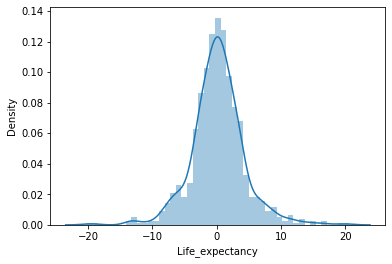

In [98]:
sns.distplot(reg_pred - y_test)

In [99]:
from sklearn.metrics import r2_score

In [100]:
score = r2_score(reg_pred, y_test)
score

0.7644702236092922

# # Ridge Regression Algorithm

In [101]:
from sklearn.linear_model import Ridge

In [102]:
from sklearn.model_selection import GridSearchCV ## hyperparamter tuning

In [103]:
ridge_regressor = Ridge()

In [104]:
# Hyperparameter Tuning
parameters = {'alpha': [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.001,0.005]}
ridgeCV = GridSearchCV(ridge_regressor,parameters,scoring='neg_median_absolute_error', cv= 5)
ridgeCV.fit(X_train,y_train)

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.7019e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86575e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19965e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.57974e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.15856e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-pac

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.74981e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.31e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68057e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84731e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18069e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\ShubhamKS\Anaconda3\lib\site-packa

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,
                                   0.001, 0.005]},
             scoring='neg_median_absolute_error')

In [105]:
print(ridgeCV.best_params_)

{'alpha': 0.001}


In [106]:
print(ridgeCV.best_score_)

-2.2820882731486263


In [107]:
## again predict

In [108]:
ridge_pred = ridgeCV.predict(X_test)

In [109]:
ridge_pred

array([68.12652515, 77.64711214, 74.89069715, 78.34208458, 54.50930161,
       49.31078493, 69.61075231, 71.56555256, 74.08539203, 48.34165199,
       48.67963256, 62.05432036, 64.45732559, 70.32631456, 70.94814937,
       61.34759989, 53.94167631, 82.64100998, 67.37413053, 83.1518265 ,
       83.02299259, 83.03455719, 70.97866478, 68.93847768, 70.51691729,
       67.03167598, 60.08630419, 60.19326952, 79.53341109, 71.66453966,
       67.36399722, 75.27197932, 68.12112116, 68.51497635, 78.6451373 ,
       53.81386782, 66.09036317, 72.81635415, 62.87383306, 76.33679066,
       54.93085612, 63.16865338, 76.4937233 , 82.04926198, 75.34289439,
       53.44543046, 79.58939881, 70.19033092, 66.5651696 , 68.32839258,
       59.4912275 , 61.57452616, 77.63731069, 72.75722778, 72.45899856,
       55.52707341, 76.06629615, 70.24472886, 66.57366601, 70.13823558,
       77.03199805, 53.44221135, 73.77940894, 69.61392108, 53.65858415,
       61.59479884, 51.60724392, 80.29058818, 59.19477665, 77.98

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """Entry point for launching an IPython kernel.


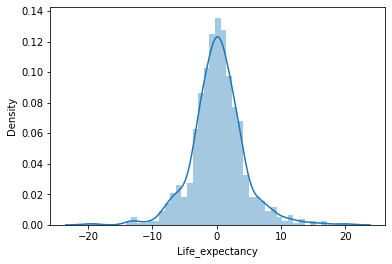

In [110]:
sns.distplot(ridge_pred - y_test)

In [111]:
from sklearn.metrics import r2_score

In [112]:
score = r2_score(reg_pred, y_test)
score

0.7644702236092922

# Lasso

In [113]:
from sklearn.linear_model import Lasso

In [114]:
lasso = Lasso()

In [115]:
# Hyperparameter Tuning
parameters = {'alpha': [1,2,5,10,20,30,40,50,60,70,80,90]}
lassoCV = GridSearchCV(lasso,parameters,scoring='neg_mean_squared_error', cv= 5)
lassoCV.fit(X_train,y_train)

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.3301228271921, tolerance: 14.3501105340146
  positive)


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1, 2, 5, 10, 20, 30, 40, 50, 60, 70, 80,
                                   90]},
             scoring='neg_mean_squared_error')

In [116]:
print(lassoCV.best_params_)
print(lassoCV.best_score_)

{'alpha': 1}
-20.966471583418546


In [117]:
lasso_pred = lassoCV.predict(X_test)

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """Entry point for launching an IPython kernel.


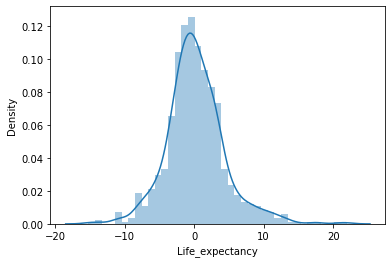

In [118]:
sns.distplot(lasso_pred - y_test)

In [119]:
from sklearn.metrics import r2_score

In [120]:
score = r2_score(lasso_pred, y_test)
score

0.7376300804243053

# DecisionTreeRegressor

In [121]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor()

In [122]:
regressor.fit(X_train, y_train)

DecisionTreeRegressor()

In [123]:
tree_y_pred = regressor.predict(X_test)
tree_y_pred

array([72.9 , 75.4 , 75.8 , 74.7 , 46.4 , 53.4 , 63.5 , 74.  , 76.4 ,
       54.9 , 58.  , 52.3 , 58.3 , 72.7 , 69.2 , 63.  , 58.6 , 79.8 ,
       73.  , 79.2 , 79.9 , 79.8 , 72.5 , 68.8 , 72.2 , 69.  , 48.1 ,
       64.  , 81.1 , 74.4 , 66.8 , 72.6 , 78.  , 71.9 , 78.3 , 53.2 ,
       53.6 , 72.  , 64.2 , 73.9 , 54.7 , 59.7 , 75.3 , 84.  , 76.8 ,
       45.5 , 86.  , 76.7 , 56.4 , 69.5 , 57.  , 69.9 , 89.  , 83.  ,
       74.4 , 60.  , 71.1 , 76.7 , 65.4 , 62.8 , 78.5 , 54.7 , 74.1 ,
       78.  , 52.9 , 54.5 , 51.4 , 74.4 , 62.1 , 72.  , 78.3 , 79.3 ,
       73.7 , 56.8 , 57.3 , 66.9 , 64.7 , 76.1 , 59.3 , 63.5 , 62.8 ,
       65.  , 64.7 , 63.2 , 63.1 , 79.5 , 73.1 , 67.3 , 71.1 , 81.7 ,
       73.  , 57.5 , 72.8 , 75.6 , 75.7 , 66.7 , 78.5 , 69.9 , 65.4 ,
       64.2 , 80.  , 55.  , 74.8 , 52.9 , 74.9 , 81.1 , 68.2 , 67.8 ,
       58.9 , 59.3 , 63.9 , 69.  , 51.7 , 68.6 , 64.6 , 77.3 , 55.5 ,
       51.5 , 58.4 , 64.  , 64.2 , 71.2 , 81.4 , 57.4 , 58.9 , 65.  ,
       79.  , 65.9 ,

In [125]:
from sklearn.metrics import r2_score
score = r2_score(tree_y_pred,y_test)

In [126]:
score

0.9279836727179425

In [127]:
# Hyperparameter Tuning
parameter = {
    'criterion':['friedman_mse', 'absolute_error', 'poisson', 'squared_error'],
    'splitter': ['best', 'random'],
    'max_depth' : [3, 4, 5,10,20,30,40,50,60,70,80,90],
} 

In [128]:
from sklearn.model_selection import GridSearchCV

In [129]:
regressors = DecisionTreeRegressor()
regCV = GridSearchCV(regressors, param_grid=parameter, cv= 5, scoring="accuracy")

In [130]:
regCV.fit(X_train, y_train)

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'absolute_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'absolute_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'absolute_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'absolute_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'absolute_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:687: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 243, in _score
    **self._kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 202, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Use

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback 

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback 

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback 

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback 

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback 

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1251, in fit
    X_idx_sorted=X_idx_sorted)
  File "C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  FitFailedWarning)
C:\Users\ShubhamKS\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:614: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback 

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['friedman_mse', 'absolute_error',
                                       'poisson', 'squared_error'],
                         'max_depth': [3, 4, 5, 10, 20, 30, 40, 50, 60, 70, 80,
                                       90],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [131]:
regCV.best_params_

{'criterion': 'friedman_mse', 'max_depth': 3, 'splitter': 'best'}

In [132]:
Ty_pred = regCV.predict(X_test)

In [134]:
r2_score(y_test, Ty_pred)

0.8311059164960872

C:\Users\ShubhamKS\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """Entry point for launching an IPython kernel.


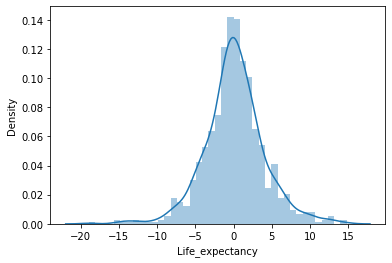

In [136]:
sns.distplot(Ty_pred - y_test)